# AI YOUTH CAMP

### Hendrik Santoso Sugiarto, Ph.D.
### Calvin Institute of Technology

CNN
---

CNN merupakan model deeplearning dengan menggunakan mekanisme konvolusi

Di PyTorch, kita dapat membuat lapisan konvolusi 2 dimensi dengan menggunakan conv2d:

In [ ]:
import torch
conv = torch.nn.Conv2d(in_channels=3,  # number of channels in the input (lower layer)
                 out_channels=7, # number of channels in the output (next layer)
                 kernel_size=5)  # size of the kernel or receiptive field


pada lapisan konvolusi, input sebuah tensor adalah dalam format/urutan:
- batch size
- channel
- height
- width

Sebagai contoh, jika kita ingin menggunakan batch dengan 32 gambar berwarna dengan ukuran 128x128:

In [ ]:
x = torch.randn(32, 3, 128, 128)
y = conv(x)
y.shape

torch.Size([32, 7, 124, 124])

## Padding
padding kadang digunakan jika ingin menghasilkan output konvolusi dengan ukuran yang sama dengan ukuran input

In [ ]:
conv2 = torch.nn.Conv2d(in_channels=3,
                  out_channels=7,
                  kernel_size=5,
                  padding=2)

x = torch.randn(32, 3, 128, 128)
y = conv2(x)
y.shape

torch.Size([32, 7, 128, 128])

## Stride
stride digunakan untuk pergeseran beberapa pixel sekaligus

In [ ]:
conv2 = torch.nn.Conv2d(in_channels=3,
                  out_channels=7,
                  kernel_size=5,
                  stride=2)

x = torch.randn(32, 3, 128, 128)
y = conv2(x)
y.shape

torch.Size([32, 7, 62, 62])

### Tugas
lakukan operasi konvolusi pada tensor x dengan padding=4 dan stride=2 dan hitung ukuran outputnya

In [ ]:
conv2 = torch.nn.Conv2d(in_channels=3,
                  out_channels=7,
                  kernel_size=5,
                  padding=4,
                  stride=2)

x = torch.randn(32, 3, 128, 128)
y = conv2(x)
y.shape

torch.Size([32, 7, 66, 66])

## Pooling


In [ ]:
pool = torch.nn.MaxPool2d(2)
X = torch.arange(16, dtype=torch.float32).reshape((1, 1, 4, 4))
print(X)
Z = pool(X)
print(Z)
Z.shape

tensor([[[[ 0.,  1.,  2.,  3.],
          [ 4.,  5.,  6.,  7.],
          [ 8.,  9., 10., 11.],
          [12., 13., 14., 15.]]]])
tensor([[[[ 5.,  7.],
          [13., 15.]]]])


torch.Size([1, 1, 2, 2])

### Tugas
Buatlah operasi pooling tanpa menggunakan MaxPool2d

In [ ]:
def pool2d_manual(X, pool_size, mode='max'):
    p_h, p_w = pool_size
    Y = torch.zeros((X.shape[0] - p_h + 1, X.shape[1] - p_w + 1))
    for i in range(Y.shape[0]):
        for j in range(Y.shape[1]):
            if mode == 'max':
                Y[i, j] = X[i: i + p_h, j: j + p_w].max()
            elif mode == 'avg':
                Y[i, j] = X[i: i + p_h, j: j + p_w].mean()
    return Y

X = torch.tensor([[0.0, 1.0, 2.0], [3.0, 4.0, 5.0], [6.0, 7.0, 8.0]])
print(pool2d_manual(X, (2, 2), 'max'))
print(pool2d_manual(X, (2, 2), 'avg'))

tensor([[4., 5.],
        [7., 8.]])
tensor([[2., 3.],
        [5., 6.]])


Cobalah MaxPool2d dengan padding, stride, multichannels

In [ ]:
pool = torch.nn.MaxPool2d(kernel_size=2, padding=1, stride=1)
X = torch.arange(16, dtype=torch.float32).reshape((1, 1, 4, 4))
Z = pool(X)
print(X)
print(Z)
Z.shape

tensor([[[[ 0.,  1.,  2.,  3.],
          [ 4.,  5.,  6.,  7.],
          [ 8.,  9., 10., 11.],
          [12., 13., 14., 15.]]]])
tensor([[[[ 0.,  1.,  2.,  3.,  3.],
          [ 4.,  5.,  6.,  7.,  7.],
          [ 8.,  9., 10., 11., 11.],
          [12., 13., 14., 15., 15.],
          [12., 13., 14., 15., 15.]]]])


torch.Size([1, 1, 5, 5])

In [ ]:
X = torch.cat((X, X + 1), 1)
Z = pool(X)
print(X)
print(Z)
Z.shape

tensor([[[[ 0.,  1.,  2.,  3.],
          [ 4.,  5.,  6.,  7.],
          [ 8.,  9., 10., 11.],
          [12., 13., 14., 15.]],

         [[ 1.,  2.,  3.,  4.],
          [ 5.,  6.,  7.,  8.],
          [ 9., 10., 11., 12.],
          [13., 14., 15., 16.]]]])
tensor([[[[ 0.,  1.,  2.,  3.,  3.],
          [ 4.,  5.,  6.,  7.,  7.],
          [ 8.,  9., 10., 11., 11.],
          [12., 13., 14., 15., 15.],
          [12., 13., 14., 15., 15.]],

         [[ 1.,  2.,  3.,  4.,  4.],
          [ 5.,  6.,  7.,  8.,  8.],
          [ 9., 10., 11., 12., 12.],
          [13., 14., 15., 16., 16.],
          [13., 14., 15., 16., 16.]]]])


torch.Size([1, 2, 5, 5])

# Dataset
Siapkan dataset dengan menggunakan CIFAR10

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms

transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

#dataset = torchvision.datasets.Caltech256(root='./data', download=True, transform=transform)

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

100%|██████████| 170M/170M [00:15<00:00, 11.0MB/s]


In [ ]:
batch_size = 32
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers=2)
classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')


torch.Size([32, 3, 32, 32])
tensor([[[[-0.4745, -0.5373, -0.5608,  ..., -0.6392, -0.6549, -0.5216],
          [-0.4980, -0.5608, -0.5451,  ..., -0.6706, -0.7255, -0.7333],
          [-0.6078, -0.6157, -0.5765,  ..., -0.5373, -0.7176, -0.7961],
          ...,
          [-0.2941, -0.1608, -0.2314,  ..., -0.3725, -0.3804, -0.3804],
          [-0.4588, -0.5686, -0.5059,  ..., -0.3333, -0.3255, -0.3255],
          [-0.6941, -0.6941, -0.6235,  ...,  0.0039,  0.0353, -0.0353]],

         [[-0.0431, -0.0824, -0.0980,  ..., -0.2392, -0.2627, -0.1137],
          [-0.0745, -0.1216, -0.0824,  ..., -0.3020, -0.2941, -0.2941],
          [-0.2078, -0.1922, -0.1373,  ..., -0.2392, -0.2706, -0.3490],
          ...,
          [ 0.1373,  0.2706,  0.2078,  ..., -0.1922, -0.1843, -0.1686],
          [-0.0275, -0.1373, -0.0667,  ..., -0.1765, -0.1608, -0.1373],
          [-0.2549, -0.2627, -0.1843,  ...,  0.1294,  0.1529,  0.1059]],

         [[-0.5137, -0.5529, -0.5765,  ..., -0.6000, -0.6706, -0.5451],
  

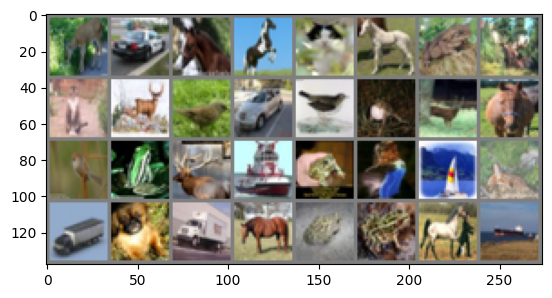

deer  car   horse horse cat   horse frog  deer  cat   deer  bird  car   bird  frog  deer  horse bird  frog  deer  ship  frog  bird  ship  deer  truck dog   truck horse frog  frog  horse ship 


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# functions to show an image


def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

print(images.shape)
print(images)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join(f'{classes[labels[j]]:5s}' for j in range(batch_size)))

### Tugas
lakukan operasi konvolusi (in_channels=3, out_channels=7, kernel_size=5, padding=2) pada gambar-gambar diatas

In [ ]:
conv = torch.nn.Conv2d(in_channels=3, out_channels=7, kernel_size=5, padding=2)


print(images.shape)
y = conv(images)           # apply the convolution
print(y.shape)
y = y.detach().numpy() # convert the result into numpy

# normalize the result to [0, 1] for plotting
y_max = np.max(y)
y_min = np.min(y)
img_after_conv = y - y_min / (y_max - y_min)
img_after_conv.shape

torch.Size([32, 3, 32, 32])
torch.Size([32, 7, 32, 32])


(32, 7, 32, 32)

plot data r,g,b beserta 7 output konvolusinya

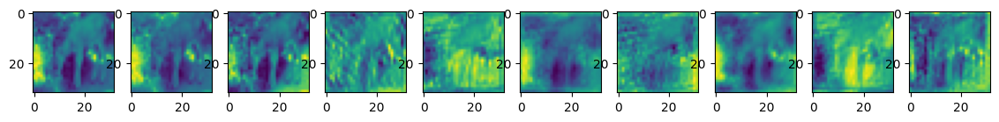

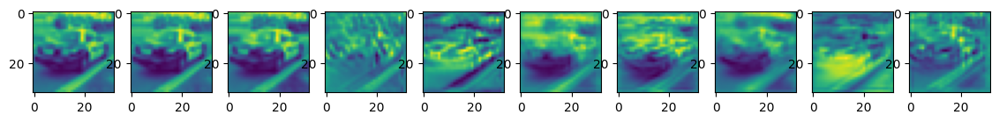

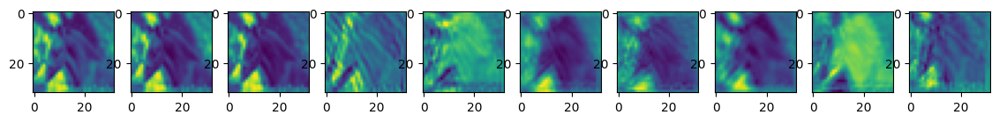

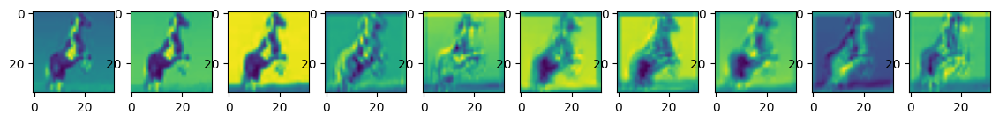

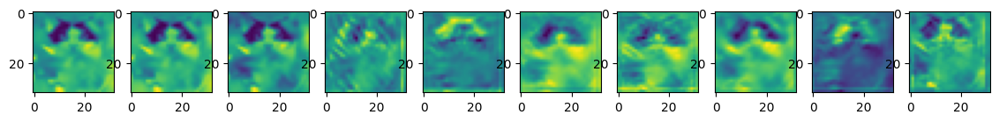

...

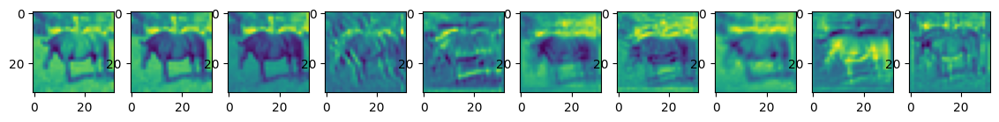

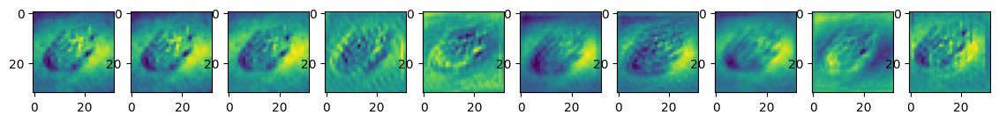

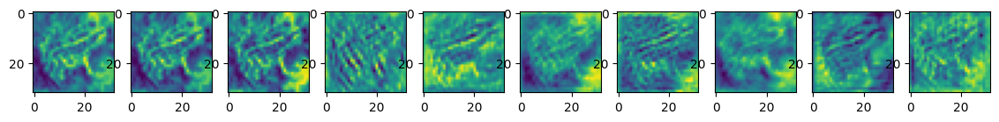

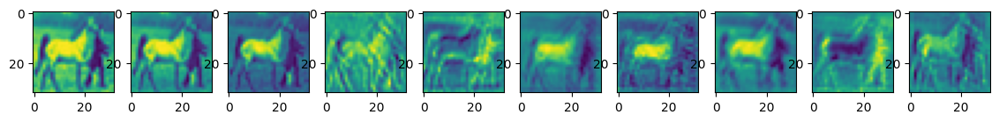

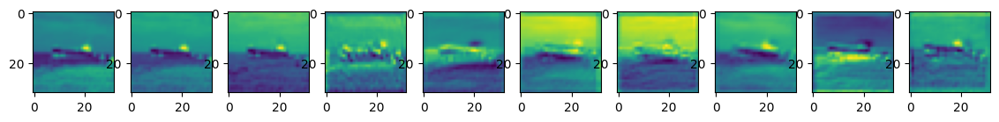

In [ ]:
for b in range(batch_size):
    plt.figure(figsize=(14,4))
    for i in range(3):
        plt.subplot(1, 10, i+1)
        plt.imshow(images[b][i])
    for i in range(7):
        plt.subplot(1, 10, i+4)
        plt.imshow(img_after_conv[b][i])
    plt.show()
    plt.close()

CNN Models
---
CNN models adalah berbagai model deep learning turunan yang menggunakan convolution layers (misalnya AlexNet, VGG, ResNet, dll)

## AlexNet

In [ ]:
import torchvision.models

#alexNet = torch.hub.load('pytorch/vision:v0.10.0', 'alexnet', pretrained=True)
alexNet = torchvision.models.alexnet(pretrained=True)
alexNet

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:05<00:00, 41.5MB/s]


AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

### Tugas
Buatlah AlexNet tanpa transfer berdasarkan struktur diatas dengan menggunakan PyTorch

In [ ]:
class AlexNet(torch.nn.Module):
  def __init__(self, num_classes=1000):
      super(AlexNet, self).__init__()
      self.conv1 = torch.nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2)
      self.relu = torch.nn.ReLU(inplace=True)
      self.maxpool = torch.nn.MaxPool2d(kernel_size=3, stride=2)
      self.conv2 = torch.nn.Conv2d(64, 192, kernel_size=5, padding=2)
      self.conv3 = torch.nn.Conv2d(192, 384, kernel_size=3, padding=1)
      self.conv4 = torch.nn.Conv2d(384, 256, kernel_size=3, padding=1)
      self.conv5 = torch.nn.Conv2d(256, 256, kernel_size=3, padding=1)
      self.avgpool = torch.nn.AdaptiveAvgPool2d((6, 6))
      self.fc1 = torch.nn.Linear(256 * 6 * 6, 4096)
      self.fc2 = torch.nn.Linear(4096, 4096)
      self.fc3 = torch.nn.Linear(4096, num_classes)
      self.dropout = torch.nn.Dropout(0.5)

  def forward(self, x):
      x = self.conv1(x)
      x = self.relu(x)
      x = self.maxpool(x)
      x = self.conv2(x)
      x = self.relu(x)
      x = self.maxpool(x)
      return

alexnet = AlexNet()
alexnet

AlexNet(
  (conv1): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv3): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (fc1): Linear(in_features=9216, out_features=4096, bias=True)
  (fc2): Linear(in_features=4096, out_features=4096, bias=True)
  (fc3): Linear(in_features=4096, out_features=1000, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

## VGG

In [ ]:
vgg = torch.hub.load('pytorch/vision:v0.10.0', 'vgg11', pretrained=True)
vgg

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG11_Weights.IMAGENET1K_V1`. You can also use `weights=VGG11_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (11): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): ReLU(inplace=True)
    (13): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (14): ReLU(inplace=True)
    (15): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
 

## ResNet

In [ ]:
import torch
resNet = torch.hub.load('pytorch/vision:v0.10.0', 'resnet18', pretrained=True)
resNet

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

### Tugas
Tampilkan hasil konvolusi resNet lapisan pertama terhadap input gambar

In [ ]:
print(images.shape)
y = resNet.conv1(images)  # apply the convolution
print(y.shape)
y = y.detach().numpy() # convert the result into numpy

# normalize the result to [0, 1] for plotting
y_max = np.max(y)
y_min = np.min(y)
img_after_conv = y - y_min / (y_max - y_min)
img_after_conv.shape

torch.Size([32, 3, 32, 32])
torch.Size([32, 64, 16, 16])


(32, 64, 16, 16)

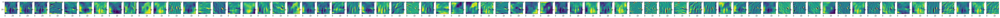

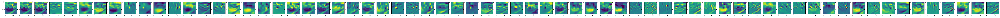

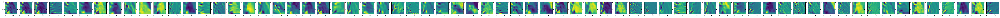

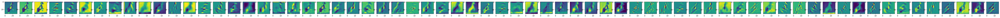

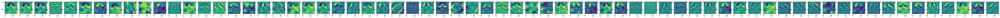

...

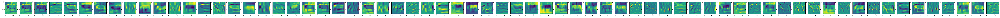

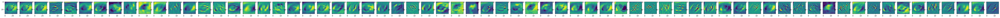

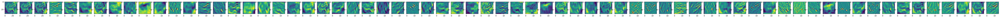

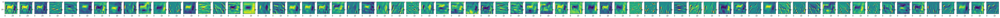

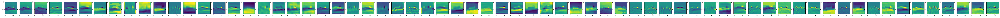

In [ ]:
for b in range(batch_size):
    plt.figure(figsize=(100,10))
    for i in range(3):
        plt.subplot(1, img_after_conv.shape[1]+3, i+1)
        plt.imshow(images[b][i])
    for i in range(img_after_conv.shape[1]):
        plt.subplot(1, img_after_conv.shape[1]+3, i+4)
        plt.imshow(img_after_conv[b][i])
    plt.show()
    plt.close()

In [ ]:
b=0
print("gambar pertama")
imshow(images[b])
for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.imshow(images[b][i])
plt.show()
plt.close()

print("hasil konvolusi")


Tugas
---

Gunakan pre-trained ResNet untuk memprediksi data tes CIFAR10

In [ ]:
%pip install torchvision --upgrade